# AllLife Bank: Credit Card Customer Segmentation
_Unsupervised Learning - Clustering_

__Joseph Reves joe.reves@gmail.com__

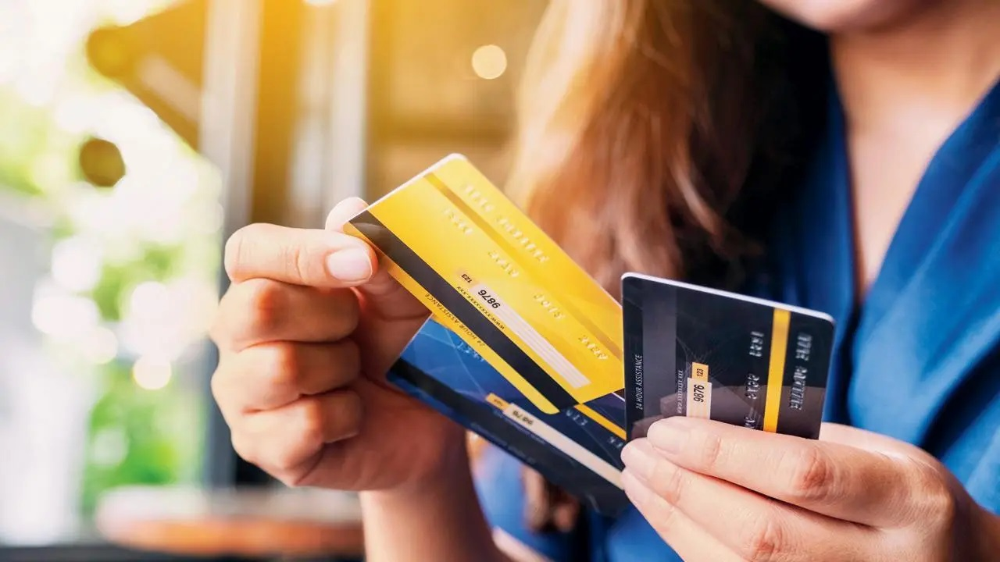

## Context and Objectives:

AllLife Bank wants to focus on its credit card customer base in the next financial year. They have been advised by their marketing research team, that the penetration in the market can be improved. Based on this input, the Marketing team proposes to run personalized campaigns to target new customers as well as upsell to existing customers. Another insight from the market research was that the customers perceive the support services of the back poorly. Based on this, the Operations team wants to upgrade the service delivery model, to ensure that customer queries are resolved faster. Head of Marketing and Head of Delivery both decide to reach out to the Data Science team for help


__Objective__

To identify different segments in the existing customer, based on their spending patterns as well as past interaction with the bank, using clustering algorithms, and provide recommendations to the bank on how to better market to and service these customers.

__Key Questions__
* What is the distribution of the average credit limit of customers?
* What percentage of the customers have never made a service-related call to the bank?
* What percentage of customers have never logged in to the online portal?
* How many customers have never visited bank?
* How are the different variables correlated with each other?

__Data Description__

The data provided is of various customers of a bank and their financial attributes like credit limit, the total number of credit cards the customer has, and different channels through which customers have contacted the bank for any queries (including visiting the bank, online and through a call center).

**Data Dictionary**

- Sl_No: Primary key of the records
- Customer Key: Customer identification number
- Average Credit Limit: Average credit limit of each customer for all credit cards
- Total credit cards: Total number of credit cards possessed by the customer
- Total visits bank: Total number of Visits that customer made (yearly) personally to the bank
- Total visits online: Total number of visits or online logins made by the customer (yearly)
- Total calls made: Total number of calls made by the customer to the bank or its customer service department (yearly)

### Assignment Objectives

__Exploratory Data Analysis__
* Univariate analysis - Key meaningful observations on individual variables and the relationship between variables
* Bivariate analysis - Use appropriate visualizations to identify the patterns and insights

__Data Pre-processing__
* Missing value Treatment
* Outlier Detection(treat, if needed- why or why not )
* Feature Engineering
* Prepare data for modeling

__Applying K-means Clustering__
* Apply K-means Clustering
* Plot the Elbow curve 
* Check Silhouette Scores
* Determine appropriate number of clusters 
* Cluster Profiling

__Applying Hierarchical Clustering__
* Apply Hierarchical clustering with different linkage methods
* Plot dendrograms for each linkage method
* Check cophenetic correlation for each linkage method
* Determine appropriate number of clusters 
* Cluster Profiling

__K-means vs Hierarchical Clustering__
* Compare clusters obtained from K-means and Hierarchical clustering techniques

__Actionable Insights & Recommendations__
* Key takeaways for the business
* Recommendations to the business

__Notebook - Overall quality__
* Structure and flow - Well commented code

## Importing necessary libraries and data

In [1]:
# this will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# useful utilities
import pandas_profiling
from tabulate import tabulate

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff

%matplotlib inline

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Clustering and analysis libraries
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import (
    pdist,
    squareform,
)  # Pairwise distribution between data points


# Supress and filter unecessary warning messages
import warnings

warnings.filterwarnings("ignore")

# load memory profiling
%load_ext memory_profiler

<IPython.core.display.Javascript object>

## Load the Dataset

<div class="alert alert-block alert-info">
<b>Dependency:</b> Loading the "Credit+Card+Customer+Data.xlsx" dataset from the local directory where the notebook is stored. For this project, I'm using Anaconda on my local machine.
</div>

In [2]:
# Reading the credit card customer dataset with the read_csv function from pandas package
credit_cust = pd.read_excel("Credit+Card+Customer+Data.xlsx")

<IPython.core.display.Javascript object>

In [3]:
# Let's make a copy while we explore the data, and potentially make some changes
customers = credit_cust.copy()

<IPython.core.display.Javascript object>

## Data Overview

- Observations
- Sanity checks

In [4]:
# Quick look at a random sample of values in the data
customers.sample(10)

,Sl_No,Customer Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made
111,112,83244,12000,2,0,4,9
184,185,76718,14000,4,0,2,4
404,405,97954,70000,7,2,0,4
205,206,99596,17000,1,0,5,5
339,340,19137,10000,6,3,1,1
0,1,87073,100000,2,1,1,0
348,349,77381,18000,4,4,2,3
167,168,33110,15000,4,2,3,6
579,580,59170,65000,4,3,0,0
71,72,35149,6000,3,2,2,7


<IPython.core.display.Javascript object>

In [5]:
# What's the size and shape of the data?
print(
    "The available data includes",
    customers.shape[0],
    "rows, with",
    customers.shape[1],
    "columns of information",
)

The available data includes 660 rows, with 7 columns of information


<IPython.core.display.Javascript object>

In [6]:
# How is the data currently typed by python?
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660 entries, 0 to 659
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   Sl_No                660 non-null    int64
 1   Customer Key         660 non-null    int64
 2   Avg_Credit_Limit     660 non-null    int64
 3   Total_Credit_Cards   660 non-null    int64
 4   Total_visits_bank    660 non-null    int64
 5   Total_visits_online  660 non-null    int64
 6   Total_calls_made     660 non-null    int64
dtypes: int64(7)
memory usage: 36.2 KB


<IPython.core.display.Javascript object>

In [7]:
# check for null values in the data
customers.isnull().sum()

Sl_No                  0
Customer Key           0
Avg_Credit_Limit       0
Total_Credit_Cards     0
Total_visits_bank      0
Total_visits_online    0
Total_calls_made       0
dtype: int64

<IPython.core.display.Javascript object>

* No Null values to deal with

In [8]:
# describe the numeric variables
customers.describe(exclude="object").applymap(lambda x: f"{x:0.3f}").T

,count,mean,std,min,25%,50%,75%,max
Sl_No,660.000,330.500,190.670,1.000,165.750,330.500,495.250,660.000
Customer Key,660.000,55141.444,25627.772,11265.000,33825.250,53874.500,77202.500,99843.000
Avg_Credit_Limit,660.000,34574.242,37625.488,3000.000,10000.000,18000.000,48000.000,200000.000
Total_Credit_Cards,660.000,4.706,2.168,1.000,3.000,5.000,6.000,10.000
Total_visits_bank,660.000,2.403,1.632,0.000,1.000,2.000,4.000,5.000
Total_visits_online,660.000,2.606,2.936,0.000,1.000,2.000,4.000,15.000
Total_calls_made,660.000,3.583,2.865,0.000,1.000,3.000,5.000,10.000


<IPython.core.display.Javascript object>

* __These look reasonable.  There are minimum zero values for visits/calls; it will be interesting to see if we have customers who have no recorded visits or calls to the bank annually - we may want to cluster those.__

In [9]:
# get a list of all our columns
columns = customers.columns
print(columns)

Index(['Sl_No', 'Customer Key', 'Avg_Credit_Limit', 'Total_Credit_Cards',
       'Total_visits_bank', 'Total_visits_online', 'Total_calls_made'],
      dtype='object')


<IPython.core.display.Javascript object>

__Duplicate Handling__

* __For this dataset, we have unique identifiers for both individual change records, and also customer identifiers__
* __We expect to see no duplicates in record identifiers, but we'll exclude those from our analysis as they are not significant and will be dropped__
* __We would expect to see duplicates in the customer identifiers, but those will also be dropped from our cluster analysis__

In [10]:
# check for duplicates
customers[
    customers.duplicated(
        subset=[
            "Avg_Credit_Limit",
            "Total_Credit_Cards",
            "Total_visits_bank",
            "Total_visits_online",
            "Total_calls_made",
        ],
        keep=False,
    )
].sort_values(by=["Customer Key"])

,Sl_No,Customer Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made
378,379,11398,12000,6,5,2,1
385,386,16418,8000,7,4,2,0
215,216,18609,8000,4,0,4,7
175,176,20524,6000,1,0,2,5
257,258,21531,10000,6,4,2,3
29,30,29112,8000,4,0,4,7
395,396,31515,5000,4,5,0,1
56,57,32828,6000,1,0,2,5
320,321,33240,12000,6,5,2,1
252,253,33457,9000,4,5,0,4


<IPython.core.display.Javascript object>

* __We have a number of different customers with identical characteristics; that's valid signal for our clustering exercise, and we'll keep those__

In [11]:
# Let's drop columns that won't help us cluster
customers.drop("Sl_No", axis=1, inplace=True)  # No value here for our model

<IPython.core.display.Javascript object>

In [12]:
# We'll just rename our customer identifiers column
customers.rename(columns={"Customer Key": "Customer_Key"}, inplace=True)

<IPython.core.display.Javascript object>

* __Presumably, we map our customer keys into a separate customer contact DB with name and other personal characteristics. But we should be able to come out of this exercise with a clear list of customer keys that are clustered by characteristics__

__We're ready to begin our exploratory data analysis__

## Exploratory Data Analysis (EDA)

#### Useful Functions

In [13]:
# Defining the function for creating boxplot and histogram
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None, hue=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots

    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="mediumturquoise"
    )  # boxplot will be created and a star will indicate the mean value of the column

    if (bins) and (hue):
        sns.histplot(
            data=data,
            x=feature,
            kde=kde,
            ax=ax_hist2,
            hue=hue,
            bins=bins,
            color="mediumpurple",
        )
    elif bins:
        sns.histplot(
            data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, color="mediumpurple"
        )
    elif hue:
        sns.histplot(
            data=data, x=feature, kde=kde, hue=hue, ax=ax_hist2, color="mediumpurple"
        )
    else:
        sns.histplot(
            data=data, x=feature, kde=kde, ax=ax_hist2, color="mediumpurple"
        )  # For histogram

    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram

    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

#### Data Profile

In [14]:
# Let's use pandas profiling from y-data to explore the larger dataset
customers.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

#### Quick Observations on Data Correlations:

* __`Total_Credit_Cards` and `Avg_Credit_Limit`are correlated, as we would expect__
* __`Total_Credit_Cards` and `Total_calls_made` are also correlated__
* __`Total_visits_bank` and `Total_visits_online` is predictably correlated__

__Customer Behaviors__

* __15.2% of customers have not visited the bank personally in the last year__
* __21.8% of customers have not used the online portal in the last year__
* __14.7% of customers have not made any calls for support in the last year__

__Variables__
* __`Avg_Credit_Limit` is right-skewed, with a long tail. Minimum value is \\$3000 and maximum is \\$200k__
* __All of our customers represented in this data set have at least one credit card__
* __At most, we're seeing people visit the bank in person five times a year (15%)__
* __Online visits are also right-skewed. The average number of portal accesses is 2.6/yr, with a maximum of 15/yr__
* __Customers seem to prefer either online or in-person interactions__


#### Let's dig into a few areas to clarify the customer behaviors we're seeing

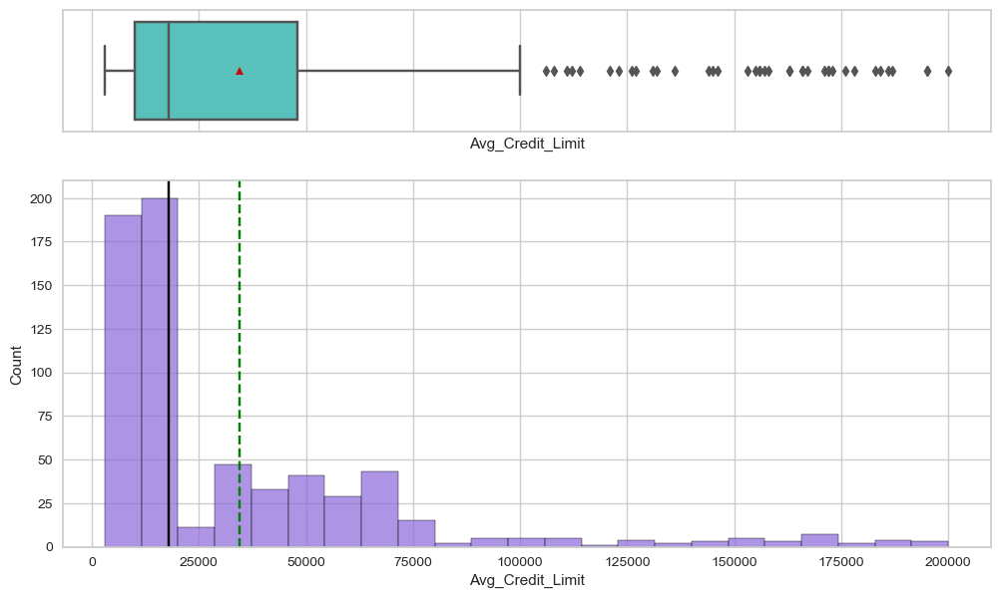

<IPython.core.display.Javascript object>

In [15]:
# Let's look at the distribution of credit limits
histogram_boxplot(customers, "Avg_Credit_Limit")

__Quite a few outliers here, which may make distinguishing the data more difficult. We could consider a log transformation here, or a distance metric less sensitive to outliers__

In [16]:
# We'll call customers that haven't called us in the last year "ghost customers"
ghost_customers = customers.loc[customers["Total_calls_made"] == 0]

<IPython.core.display.Javascript object>

__We know from our analysis above that 14.7% of our customers haven't contacted us in the last year__

Let's look at the characteristics of this group that's "ghosting" us:

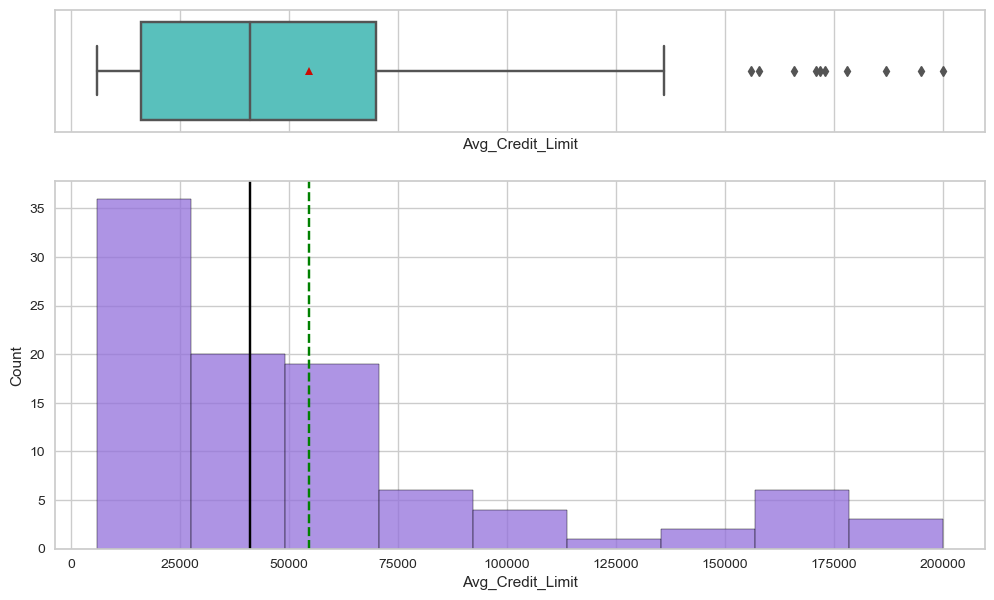

<IPython.core.display.Javascript object>

In [17]:
# distribution of credit limits for customers out of contact
histogram_boxplot(ghost_customers, "Avg_Credit_Limit")

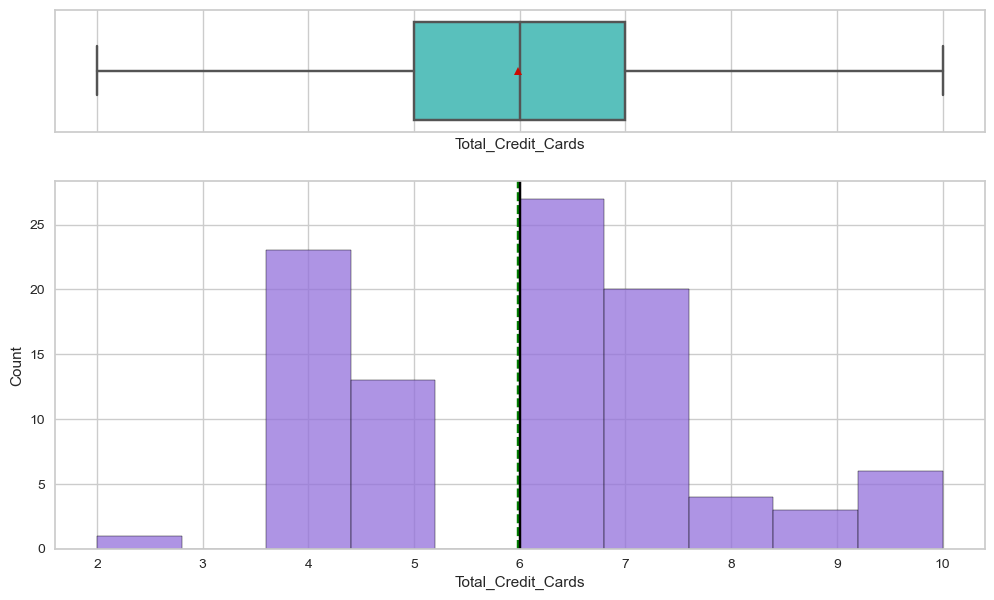

<IPython.core.display.Javascript object>

In [18]:
# likewise, credit cards held by customers who are not contacting us
histogram_boxplot(ghost_customers, "Total_Credit_Cards")

* __The customers that aren't contacting us have an average of six credit cards, and their mean credit limit across these cards is pretty high - over \\$50k. This is higher than our general customer base.__

  __Perhaps we should make more of an effort to reach out to these customers.__

In [19]:
# We'll call customers that haven't used the portal in the last year "luddite customers"
luddite_customers = customers.loc[customers["Total_visits_online"] == 0]

<IPython.core.display.Javascript object>

__We know from our analysis above that 21.8% of our customers have not logged into the online portal in the last year__

Let's look at the characteristics of this group that's choosing not to use online access:

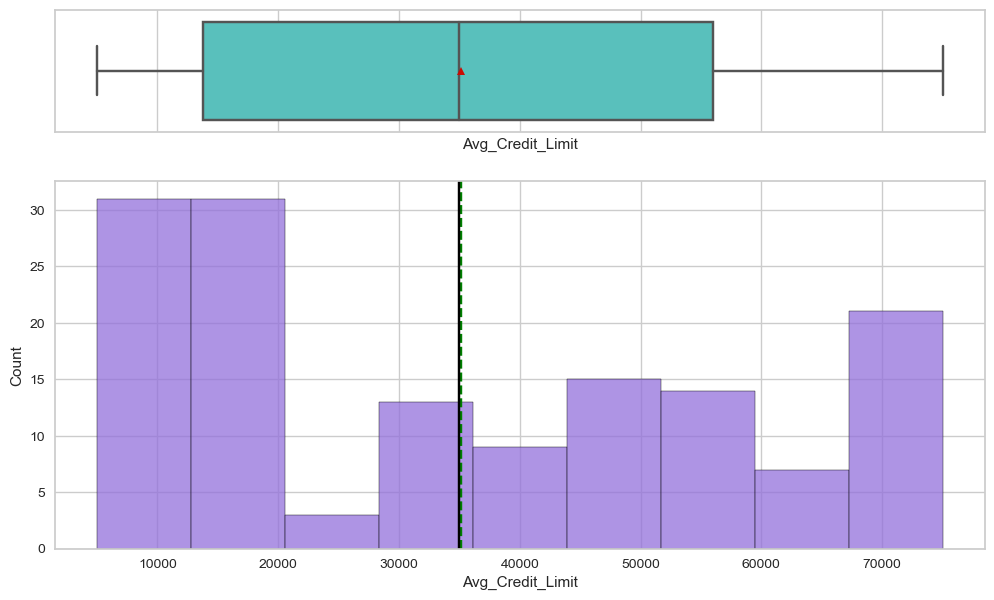

<IPython.core.display.Javascript object>

In [20]:
# What do the credit limits look like for customers who choose not to use the portal?
histogram_boxplot(luddite_customers, "Avg_Credit_Limit")

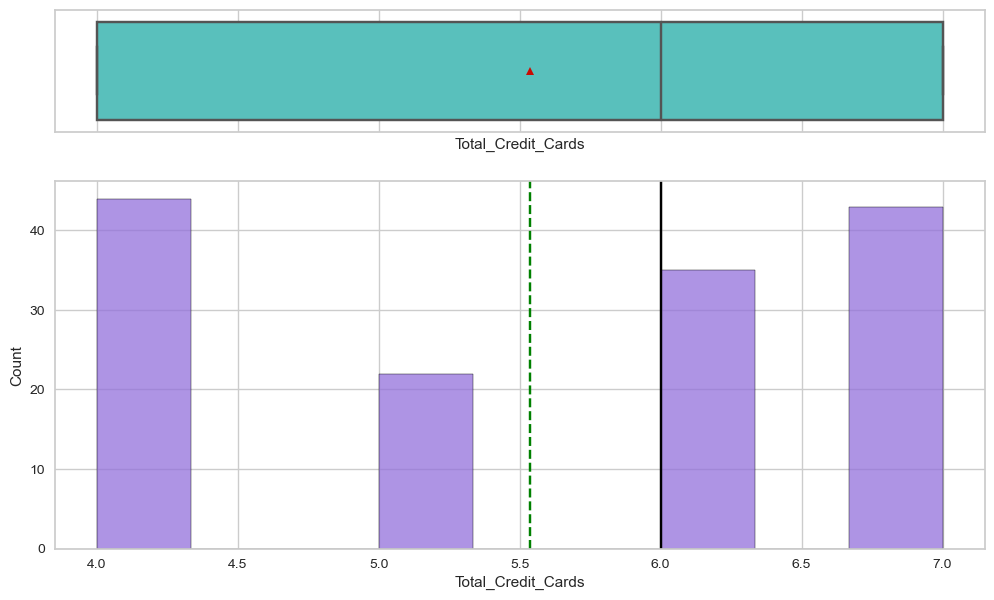

<IPython.core.display.Javascript object>

In [21]:
# likewise, credit cards held by customers who choose not to use the online portal
histogram_boxplot(luddite_customers, "Total_Credit_Cards")

* __For customers who don't use the online portal, their number of credit cards and average limit is lower than customers who don't place support calls, and also lower than our general customer base.__

  __We could consider online-only incentives or discounts to attract engagement for these users__

* __Let's look at people who choose to physically visit the bank__

In [22]:
# We'll call customers that never physically show up at the bank at least once in the last year "remote customers"
remote_customers = customers.loc[customers["Total_visits_bank"] == 0]

<IPython.core.display.Javascript object>

We know from our analysis above that 15.2% of our customers have physically visited the bank in the last year

Let's look at the characteristics of this group that's opting for completely remote banking:

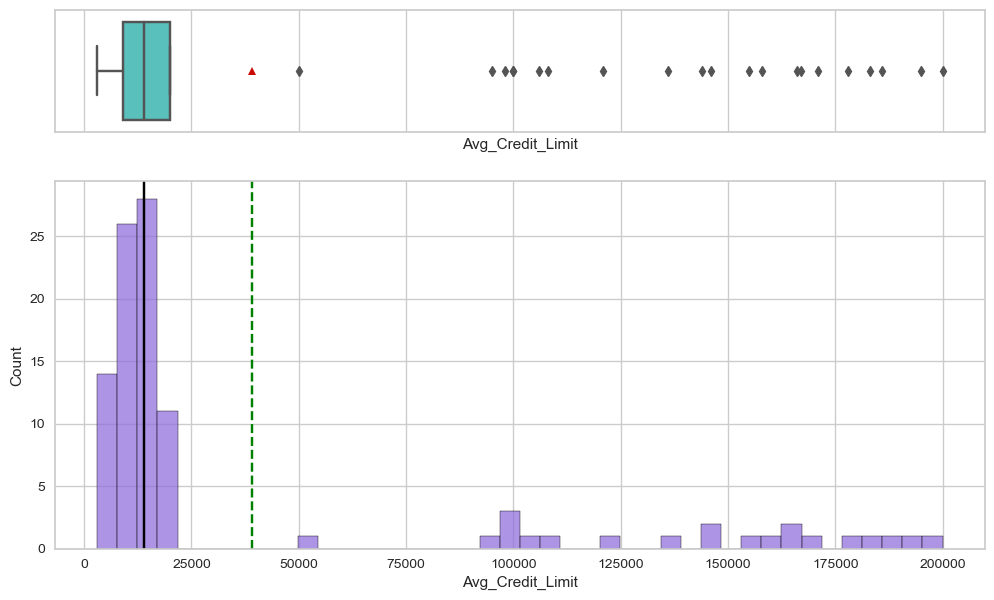

<IPython.core.display.Javascript object>

In [23]:
# distribution of credit limits for remote banking customers
histogram_boxplot(remote_customers, "Avg_Credit_Limit")

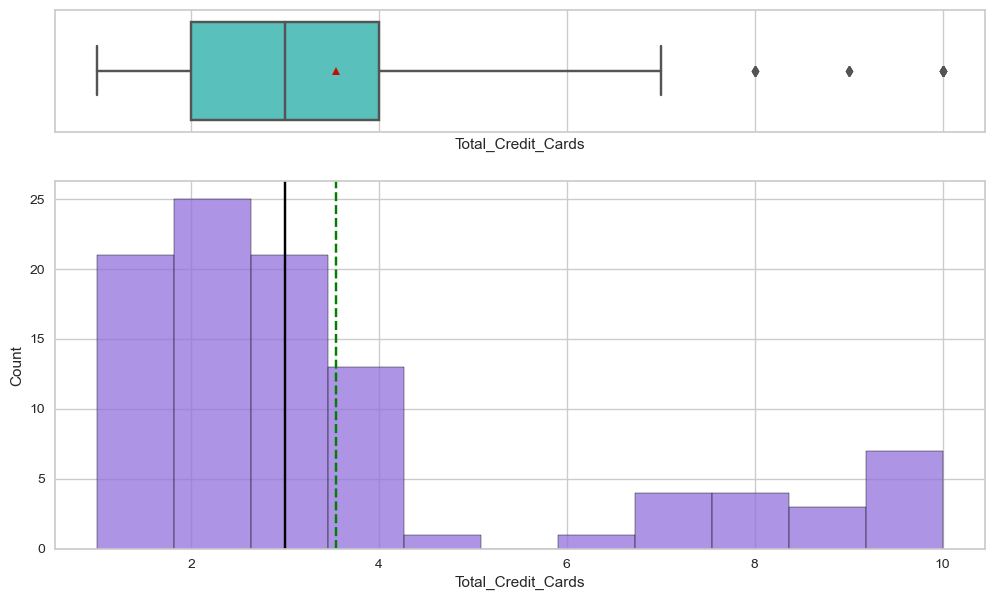

<IPython.core.display.Javascript object>

In [24]:
# likewise, credit cards held by remote banking customers
histogram_boxplot(remote_customers, "Total_Credit_Cards")

* __For our remote banking customers who don't physically visit the bank, their number of credit cards and average limit is lower than customers who do come to the lobby, but our outliers at the higher end of credit limits and number of cards are also in this group of remote banking customers.__

  __We need to understand their preferred method of doing business with the bank, and make sure these outliers aren't left with no active engagement with the bank.__

In [25]:
def access_both(row):
    if (row["Total_visits_bank"] > 0) & (row["Total_visits_online"] > 0):
        return 1
    else:
        return 0

<IPython.core.display.Javascript object>

In [26]:
customers["Both"] = customers.apply(access_both, axis=1)
customers["Both"] = customers["Both"].astype("int64")

<IPython.core.display.Javascript object>

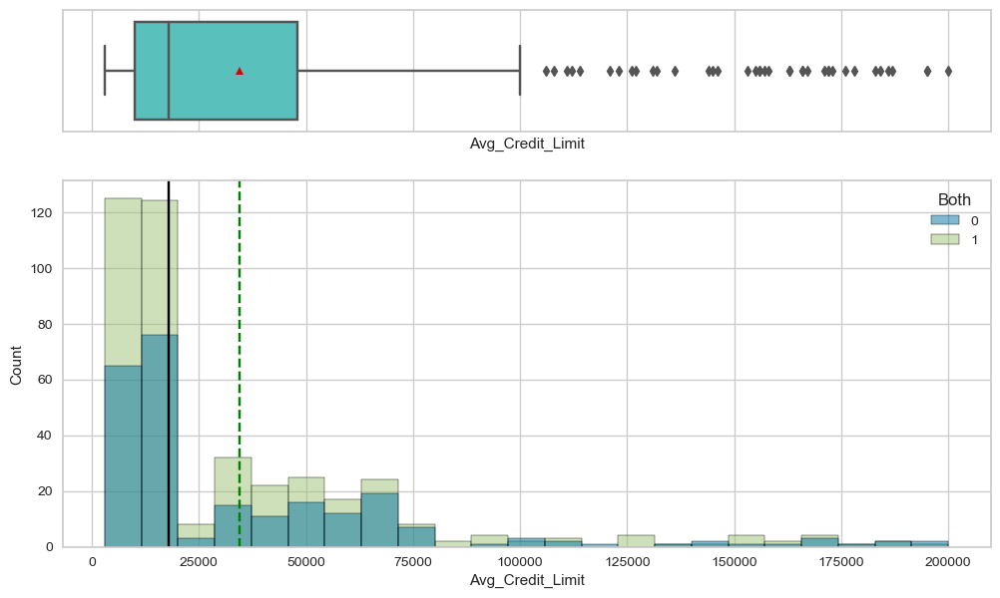

<IPython.core.display.Javascript object>

In [27]:
histogram_boxplot(customers, "Avg_Credit_Limit", hue="Both")

* __Our customers who bank with us both in the lobby and online span the entire range of credit limits__

#### Correlations

In [28]:
# selecting numerical columns
num_cols = customers.select_dtypes(include=np.number).columns.tolist()

<IPython.core.display.Javascript object>

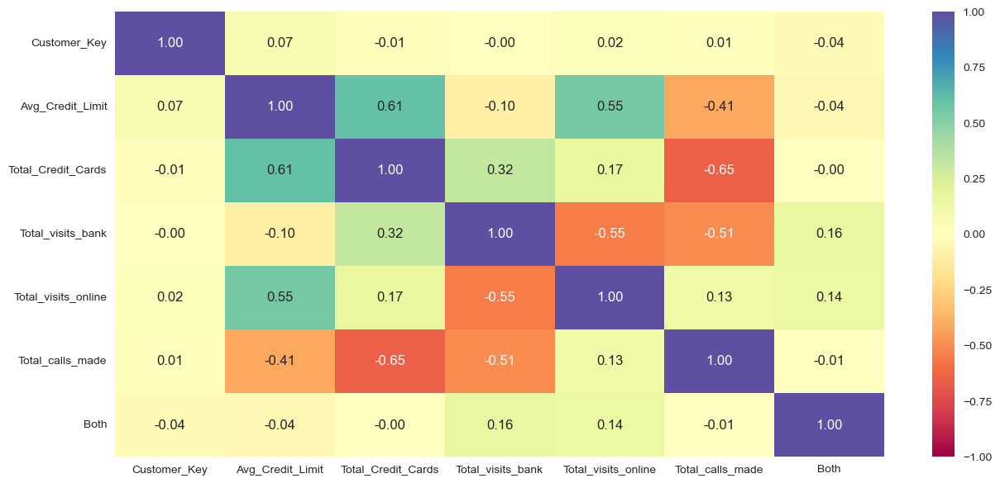

<IPython.core.display.Javascript object>

In [29]:
# Finally, let's plot our correlations
plt.figure(figsize=(15, 7))
sns.heatmap(
    customers[num_cols].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)
plt.show()

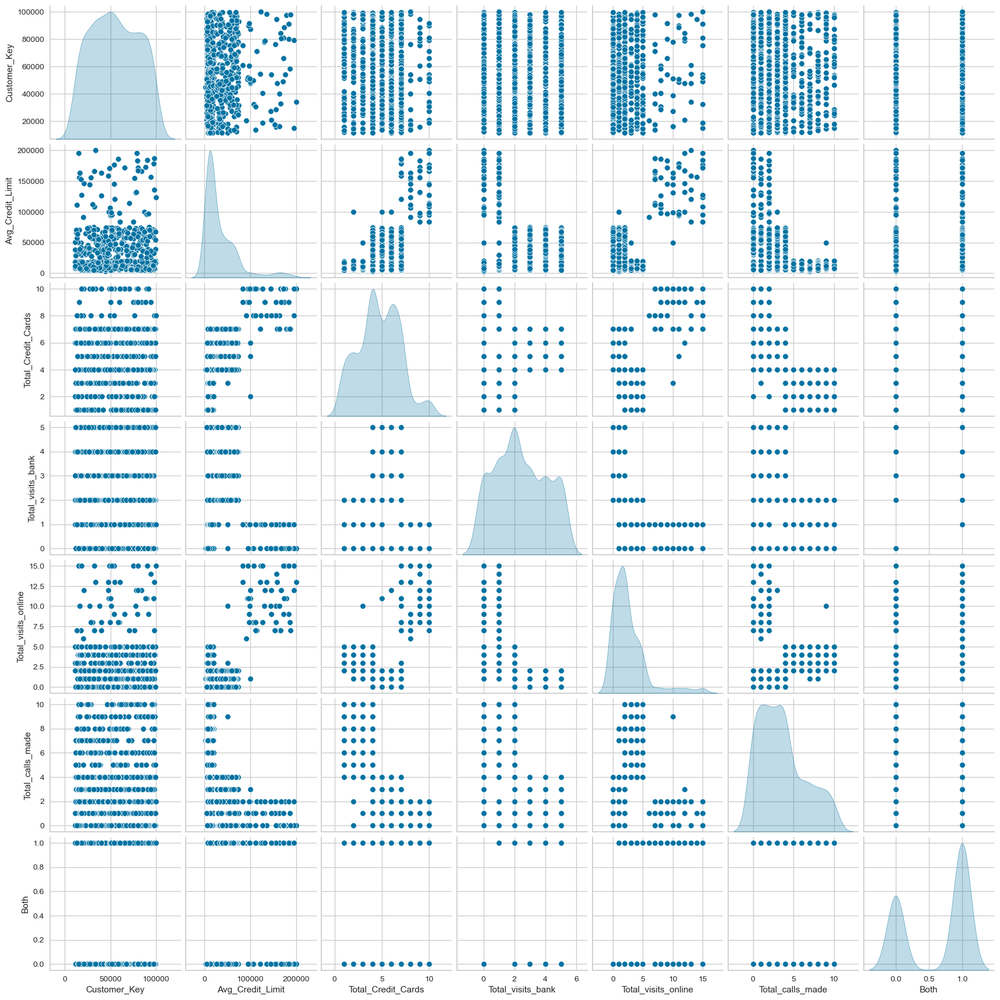

<IPython.core.display.Javascript object>

In [30]:
sns.pairplot(customers, diag_kind="kde")
plt.show()

__We see the skew clearly here for credit limit.__

## Data Preprocessing

* __One key observation is that our credit limit variable is highly skewed, and difficult to distinguish.__
* __Let's apply a log transformation to the credit limit, and see if we can get a more distinct distribution that will be useful for our clustering algorithms.__

In [31]:
# Add a column to the dataset for log-transformed credit limits
customers["Avg_Credit_Limit_log"] = np.log(customers["Avg_Credit_Limit"])

<IPython.core.display.Javascript object>

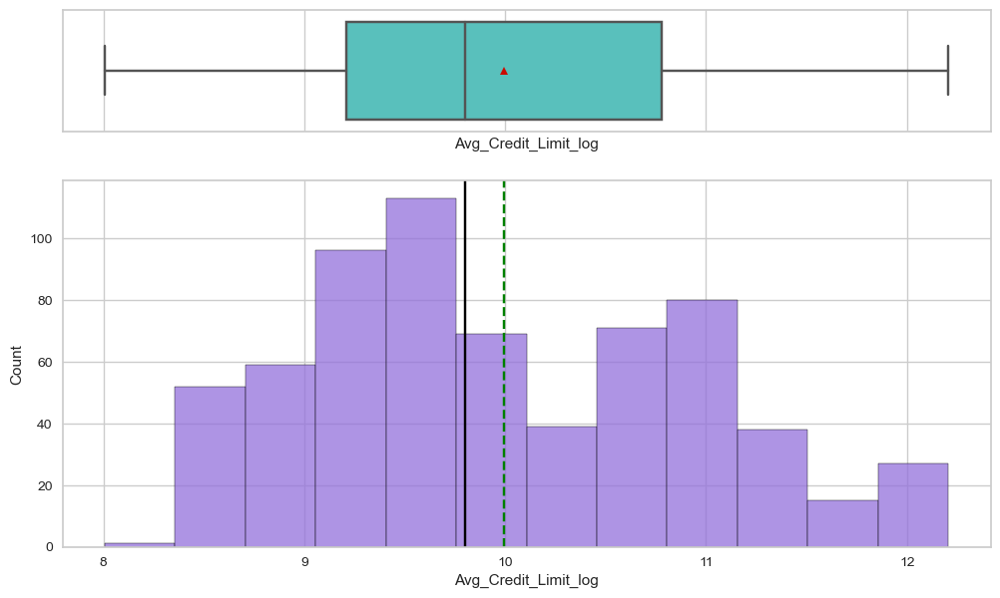

<IPython.core.display.Javascript object>

In [32]:
# Let's take a look at this distribution
histogram_boxplot(customers, "Avg_Credit_Limit_log")

__That's a much clearer distribution; that should take care of our outliers__

#### Scale the features

In [33]:
# We'll create a new data frame with the scaled data we need for our clustering exercise
sc = StandardScaler()
customers_scaled = pd.DataFrame(
    sc.fit_transform(
        customers.drop(["Customer_Key", "Avg_Credit_Limit", "Both"], axis=1)
    ),
    columns=customers.drop(
        ["Customer_Key", "Avg_Credit_Limit", "Both"], axis=1
    ).columns,
)
customers_scaled.head()

,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,Avg_Credit_Limit_log
0,-1.249225,-0.860451,-0.547490,-1.251537,1.630478
1,-0.787585,-1.473731,2.520519,1.891859,0.885387
2,1.058973,-0.860451,0.134290,0.145528,0.885387
3,0.135694,-0.860451,-0.547490,0.145528,0.336281
4,0.597334,-1.473731,3.202298,-0.203739,1.630478


<IPython.core.display.Javascript object>

## EDA Final

In [34]:
# Here's a snapshot of the scaled dataframe
customers_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660 entries, 0 to 659
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Total_Credit_Cards    660 non-null    float64
 1   Total_visits_bank     660 non-null    float64
 2   Total_visits_online   660 non-null    float64
 3   Total_calls_made      660 non-null    float64
 4   Avg_Credit_Limit_log  660 non-null    float64
dtypes: float64(5)
memory usage: 25.9 KB


<IPython.core.display.Javascript object>

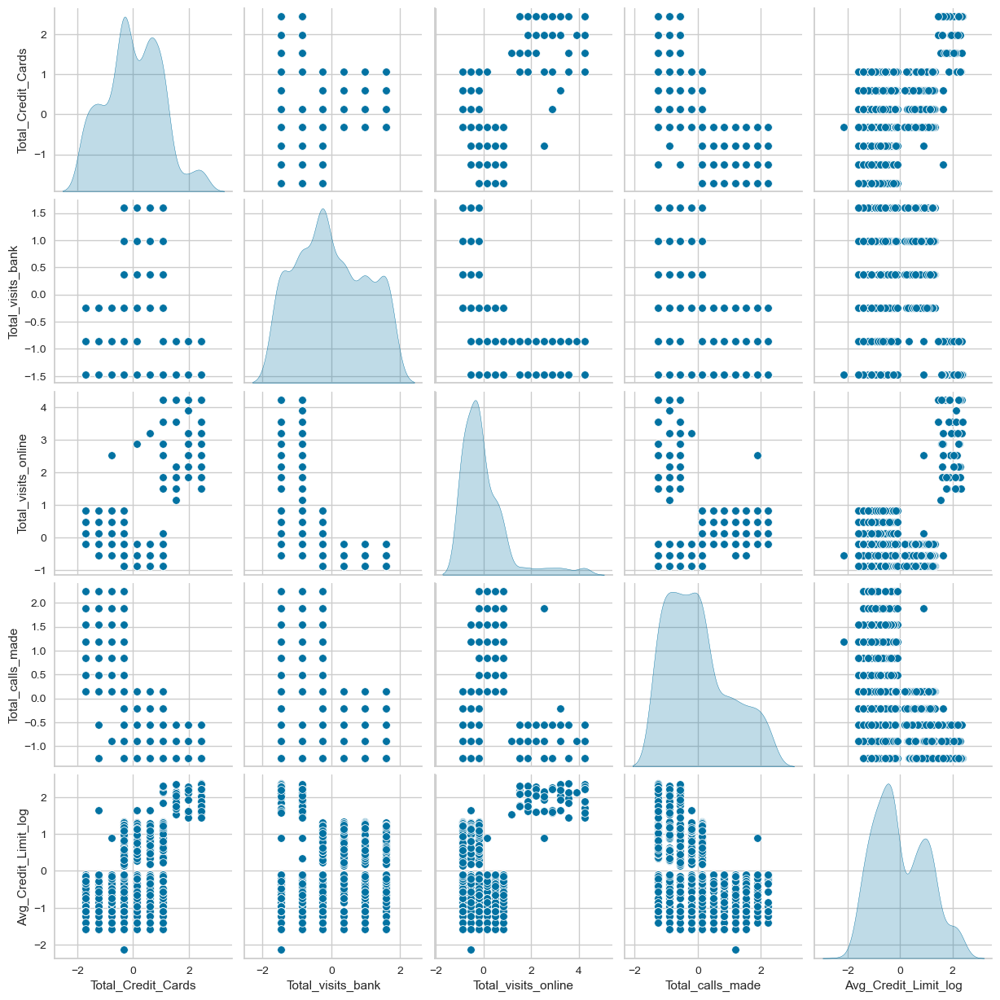

<IPython.core.display.Javascript object>

In [35]:
# We'll take a look at the pairplot for the scaled data
sns.pairplot(customers_scaled, diag_kind="kde")
plt.show()

__Looking at the distributions along the diagonal, we get a sense that we may see 3-4 clusters emerge here__

## K-means Clustering

In [36]:
%%time
%%memit
# Let's explore the mean distortions for a range of cluster sizes
clusters = range(1, 10)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k)
    model.fit(customers_scaled)
    prediction = model.predict(customers_scaled)
    # distortion = (
    #     sum(
    #         np.min(cdist(subset_scaled_df, model.cluster_centers_, "euclidean"), axis=1)
    #     )
    #     / subset_scaled_df.shape[0]
    # )
    distortion = model.inertia_
    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)


Number of Clusters: 1 	Average Distortion: 3300.0000000000005
Number of Clusters: 2 	Average Distortion: 1980.6549709518565
Number of Clusters: 3 	Average Distortion: 1090.3509940097306
Number of Clusters: 4 	Average Distortion: 860.7483178848755
Number of Clusters: 5 	Average Distortion: 775.816017226937
Number of Clusters: 6 	Average Distortion: 697.7495574145012
Number of Clusters: 7 	Average Distortion: 634.212080868324
Number of Clusters: 8 	Average Distortion: 598.8835205840785
Number of Clusters: 9 	Average Distortion: 570.7120091757521
peak memory: 338.24 MiB, increment: 3.00 MiB
Wall time: 1.58 s


<IPython.core.display.Javascript object>

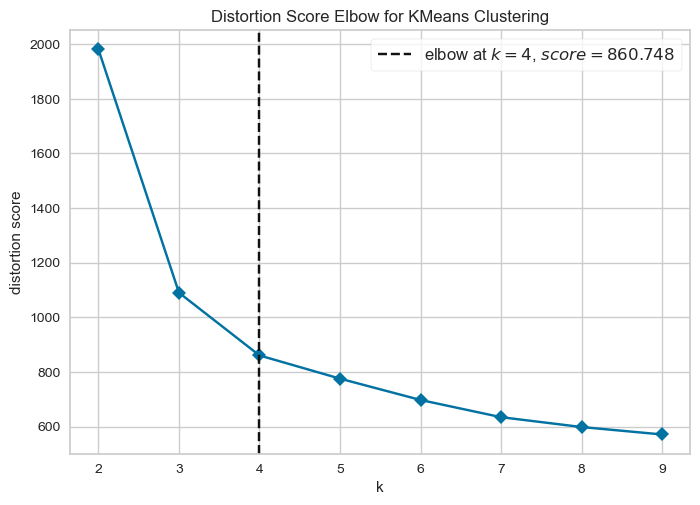

Wall time: 672 ms


<IPython.core.display.Javascript object>

In [37]:
%%time
# Now we'll plot the elbow curve for this range of cluster sizes
visualizer = KElbowVisualizer(model, k=(2, 10), timings=False)

visualizer.fit(customers_scaled)  # Fit the data to the visualizer
visualizer.show()  # Finalize and render the figure
plt.show()

__From the elbow curve, the optimal number of clusters looks like 4__

In [38]:
%%time
# Next we'll calculate silhouette scores, and plot those
sil_score = []
cluster_list = list(range(2, 10))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict((customers_scaled))
    # centers = clusterer.cluster_centers_
    score = silhouette_score(customers_scaled, preds)
    sil_score.append(score)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.4092836475060537
For n_clusters = 3, silhouette score is 0.49300104499973413
For n_clusters = 4, silhouette score is 0.3849070337585793
For n_clusters = 5, silhouette score is 0.3489884118963439
For n_clusters = 6, silhouette score is 0.2604879618648622
For n_clusters = 7, silhouette score is 0.26323975216061685
For n_clusters = 8, silhouette score is 0.24631203066610335
For n_clusters = 9, silhouette score is 0.23484961213216032
Wall time: 459 ms


<IPython.core.display.Javascript object>

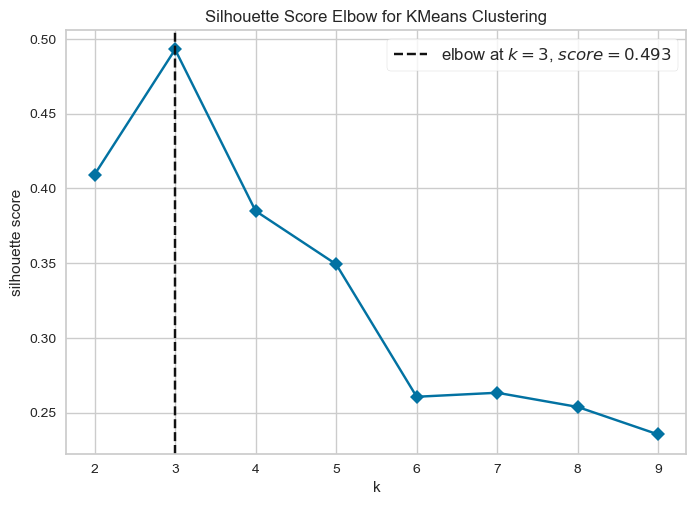

Wall time: 576 ms


<IPython.core.display.Javascript object>

In [39]:
%%time
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 10), timings=False, metric="silhouette")

visualizer.fit(customers_scaled)  # Fit the data to the visualizer
visualizer.show()  # Finalize and render the figure
plt.show()

__Based on the silhouette scores, three clusters is the best value__

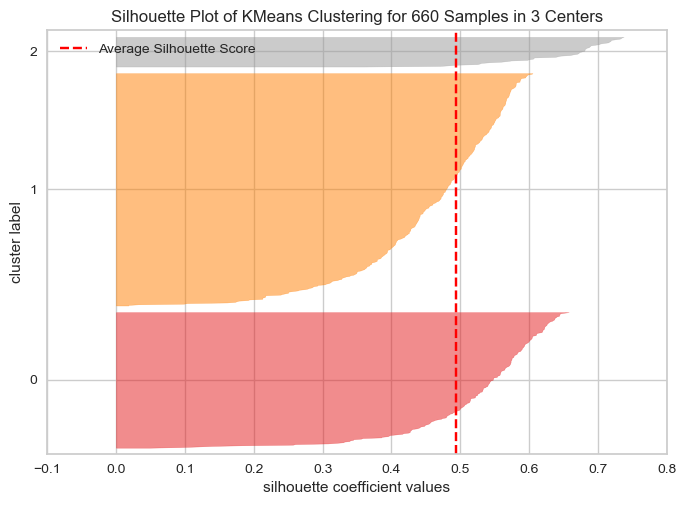

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 660 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [40]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(customers_scaled)
visualizer.show()

* __Three clusters gives us a reasonable distribution, with all the coefficients above the mean and no negative samples.__

__Let's visualize four clusters, as well__

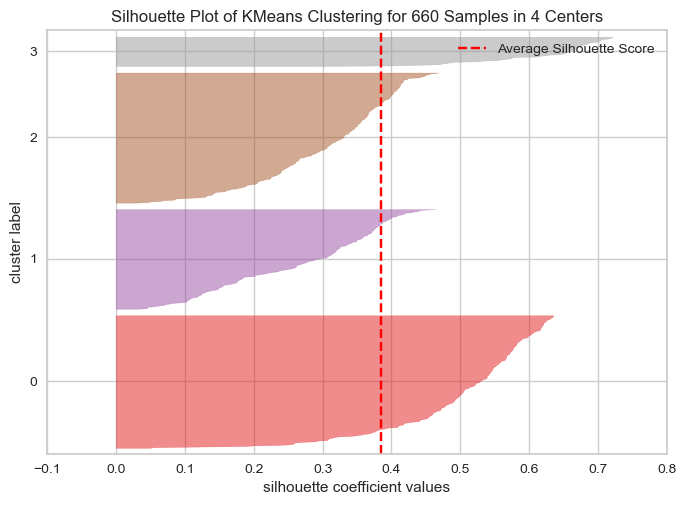

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 660 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [41]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(customers_scaled)
visualizer.show()

* __Four clusters also gives us a good distribution, with all clusters above the mean. This would also be a reasonable grouping__

* __Let's go ahead and label and evaluate our results based on four clusters__

In [42]:
%%time
%%memit
# fitting our scaled data based on four clusters
kmeans = KMeans(n_clusters=4, random_state=1)
kmeans.fit(customers_scaled)

peak memory: 345.90 MiB, increment: 0.00 MiB
Wall time: 1.11 s


<IPython.core.display.Javascript object>

In [43]:
# adding kmeans cluster labels to the scaled and original dataframes
customers["K_means_segments"] = kmeans.labels_
customers_scaled["K_means_segments"] = kmeans.labels_

<IPython.core.display.Javascript object>

In [44]:
# creating our cluster profile
cluster_profile = customers.groupby("K_means_segments").mean()

<IPython.core.display.Javascript object>

In [45]:
# adding a count by cluster
cluster_profile["count_in_each_segment"] = (
    customers.groupby("K_means_segments")["Avg_Credit_Limit"].count().values
)

<IPython.core.display.Javascript object>

In [46]:
# let's display cluster profiles - MAX
cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Customer_Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,Both,Avg_Credit_Limit_log,count_in_each_segment
K_means_segments,,,,,,,,,
0,55163.973094,12197.309417,2.403587,0.928251,3.560538,6.883408,0.641256,9.320232,223
1,51927.238095,12238.095238,5.464286,3.595238,1.005952,1.940476,0.630952,9.331469,168
2,57226.360731,50187.214612,5.547945,3.401826,0.968037,2.054795,0.625571,10.776538,219
3,56708.760000,141040.000000,8.740000,0.600000,10.900000,1.080000,0.600000,11.825513,50


<IPython.core.display.Javascript object>

In [47]:
# let's display cluster profiles - MIN
cluster_profile.style.highlight_min(color="lightblue", axis=0)

,Customer_Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,Both,Avg_Credit_Limit_log,count_in_each_segment
K_means_segments,,,,,,,,,
0,55163.973094,12197.309417,2.403587,0.928251,3.560538,6.883408,0.641256,9.320232,223
1,51927.238095,12238.095238,5.464286,3.595238,1.005952,1.940476,0.630952,9.331469,168
2,57226.360731,50187.214612,5.547945,3.401826,0.968037,2.054795,0.625571,10.776538,219
3,56708.760000,141040.000000,8.740000,0.600000,10.900000,1.080000,0.600000,11.825513,50


<IPython.core.display.Javascript object>

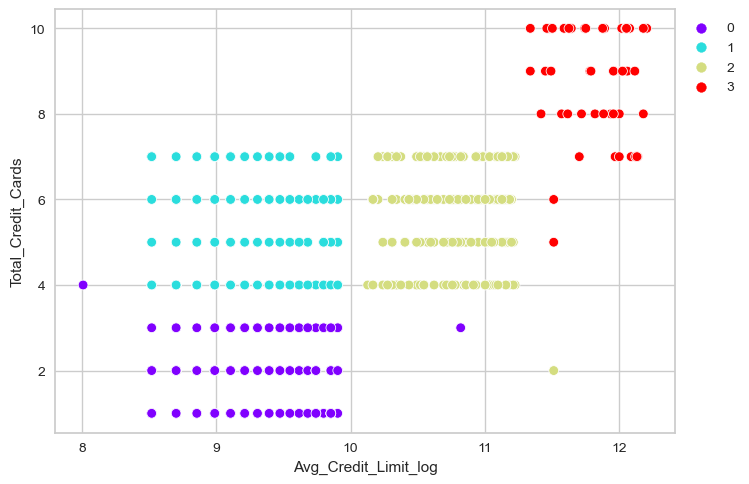

<IPython.core.display.Javascript object>

In [48]:
# One more way to visualize our clusters
sns.scatterplot(
    data=customers,
    x="Avg_Credit_Limit_log",
    y="Total_Credit_Cards",
    hue=customers["K_means_segments"],
    palette="rainbow",
)
plt.legend(bbox_to_anchor=(1, 1))

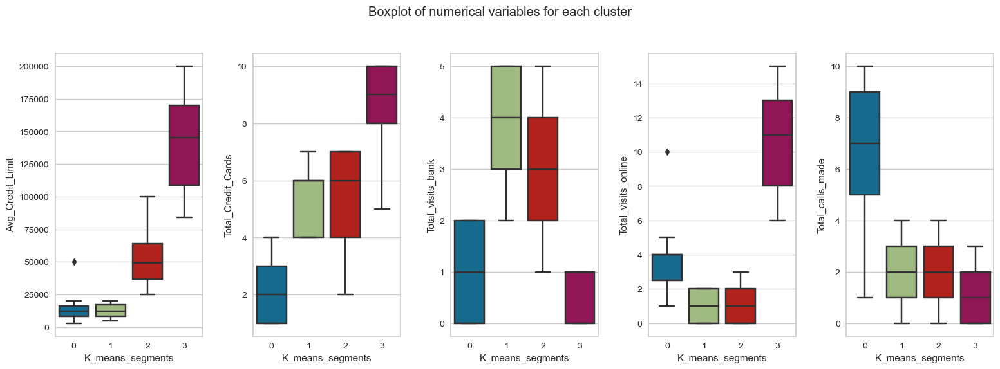

<IPython.core.display.Javascript object>

In [49]:
# Now we'll look at a plot of the relevant features, excluding Customer Key
fig, axes = plt.subplots(1, 5, figsize=(16, 6))
fig.suptitle("Boxplot of numerical variables for each cluster")
counter = 1
for ii in range(5):
    sns.boxplot(
        ax=axes[ii], y=customers[num_cols[counter]], x=customers["K_means_segments"]
    )
    counter = counter + 1

fig.tight_layout(pad=2.0)

### Insights

- **Cluster 0**:
  - Distinctly the predominate callers into the support line
  - At the same time, they are relatively infrequently users of the online portal
  - Least number of credit cards of all the segments, with a correspondingly low average credit limit
- **Cluster 1**:
  - This is the segment that prefers mostly to visit the bank lobby physically
  - Infrequently users of online banking, and also infrequently calls into the support line
  - These users have more credit cards in their wallet, but a relatively low average credit limit
- **Cluster 2**:
  - This segment also strongly prefers to visit the bank lobby
  - They have a broader range of credit cards in their wallet, and a higher average credit limit than segment 1
  - Also relatively infrequent users of the online portal, or the support line
- **Cluster 3**:
  - This segment is distinguished with the greatest number of credit cards, and the highest average credit limits
  - These customers prefer to do their banking on the online portal, visiting the bank very infrequently
  - They are also the least frequent callers into online support, suggesting a better educated or more sophisticated group

__Group Membership__

In [50]:
# We'll store a list of customer keys in each segment to use for our comparison later on
k_means_cluster_0 = (
    customers.loc[customers["K_means_segments"] == 0, "Customer_Key"].unique().tolist()
)

k_means_cluster_1 = (
    customers.loc[customers["K_means_segments"] == 1, "Customer_Key"].unique().tolist()
)

k_means_cluster_2 = (
    customers.loc[customers["K_means_segments"] == 2, "Customer_Key"].unique().tolist()
)

k_means_cluster_3 = (
    customers.loc[customers["K_means_segments"] == 3, "Customer_Key"].unique().tolist()
)

<IPython.core.display.Javascript object>

__Our demographic information is limited, but presumably we could use the Customer Key value to determine more detailed information about the membership in each of our segments.__

__For this exercise, we'll just store the keys in each segment, and use that in our comparison of the clustering methods later on__

## Cophenetic correlation

In [51]:
# Going into the next phase, here's the state of the data we are working with
print("Customers\n*********")
print(customers.info())
print("\nCustomers Scaled\n****************")
print(customers_scaled.info())

Customers
*********
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660 entries, 0 to 659
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Customer_Key          660 non-null    int64  
 1   Avg_Credit_Limit      660 non-null    int64  
 2   Total_Credit_Cards    660 non-null    int64  
 3   Total_visits_bank     660 non-null    int64  
 4   Total_visits_online   660 non-null    int64  
 5   Total_calls_made      660 non-null    int64  
 6   Both                  660 non-null    int64  
 7   Avg_Credit_Limit_log  660 non-null    float64
 8   K_means_segments      660 non-null    int32  
dtypes: float64(1), int32(1), int64(7)
memory usage: 44.0 KB
None

Customers Scaled
****************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660 entries, 0 to 659
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Tot

<IPython.core.display.Javascript object>

In [52]:
# For our analysis, we'll just drop the K-means segments from our scaled data
customers_scaled.drop("K_means_segments", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [53]:
customers_scaled.sample(10)

,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,Avg_Credit_Limit_log
559,1.058973,1.592670,-0.206600,-0.203739,0.672065
586,1.058973,0.366110,-0.888380,-0.553005,0.371528
642,2.443892,-0.860451,2.179629,-0.553005,1.597736
16,-1.249225,-0.860451,-0.206600,0.145528,-0.408809
538,1.058973,0.979390,-0.547490,-0.203739,1.306808
389,-0.325946,1.592670,-0.888380,-0.203739,-0.742207
95,-1.710864,-0.247170,0.816070,1.193326,-1.589750
517,-0.325946,-0.247170,-0.206600,-0.203739,1.116619
360,0.597334,0.366110,-0.888380,-0.902271,-0.482972
74,-1.249225,-1.473731,0.816070,1.542593,-1.228063


<IPython.core.display.Javascript object>

In [54]:
# Length of the pairwise distances
len(pdist(customers_scaled))

217470

<IPython.core.display.Javascript object>

In [55]:
# Calculate our pairwise distances between all pairs of features in the scaled dataset
print(squareform(pdist(customers_scaled)))

[[0.         4.52084039 2.8808943  ... 3.92309692 6.06261575 5.06668487]
 [4.52084039 0.         3.53972465 ... 3.86485901 5.03670285 3.9742535 ]
 [2.8808943  3.53972465 0.         ... 2.60850164 4.72939389 3.57906242]
 ...
 [3.92309692 3.86485901 2.60850164 ... 0.         2.27849418 1.33421157]
 [6.06261575 5.03670285 4.72939389 ... 2.27849418 0.         1.45740512]
 [5.06668487 3.9742535  3.57906242 ... 1.33421157 1.45740512 0.        ]]


<IPython.core.display.Javascript object>

In [56]:
# here's the range of the indexes in the scaled dataset - 660 rows
min(customers_scaled.index), max(customers_scaled.index)

(0, 659)

<IPython.core.display.Javascript object>

#### Linkage

*  __Linkage returns a matrix with four values each for n-1 rows__
   
   __Each row describes a merge operation between two clusters at a specific step of hierarchical clustering__


*  __The first two values are the indicies of the clusters that are merging__
*  __The third value is the distance between the two clusters__
*  __The fourth value is the number of samples in the newly merged cluster__

*  __This calculation is the basis for the visual dendrograms we'll generate to represent different clustering methods__

In [57]:
# First five merge operations, with the linkage matrix
linkage(customers_scaled.reset_index(drop=True), metric="euclidean", method="single")[
    :5
]

array([[464., 497.,   0.,   2.],
       [425., 455.,   0.,   2.],
       [250., 361.,   0.,   2.],
       [334., 385.,   0.,   2.],
       [257., 295.,   0.,   2.]])

<IPython.core.display.Javascript object>

In [58]:
headers = ["Cluster #1", "Cluster #2", "Distance", "Num of Samples"]

<IPython.core.display.Javascript object>

In [59]:
# First five merge operations, with the linkage matrix
print(
    tabulate(
        linkage(
            customers_scaled.reset_index(drop=True), metric="euclidean", method="single"
        )[:5],
        headers=headers,
    )
)

  Cluster #1    Cluster #2    Distance    Num of Samples
------------  ------------  ----------  ----------------
         464           497           0                 2
         425           455           0                 2
         250           361           0                 2
         334           385           0                 2
         257           295           0                 2


<IPython.core.display.Javascript object>

In [60]:
# last five merge operations, with the linkage matrix
print(
    tabulate(
        linkage(
            customers_scaled.reset_index(drop=True), metric="euclidean", method="single"
        )[-5:],
        headers=headers,
    )
)

  Cluster #1    Cluster #2    Distance    Num of Samples
------------  ------------  ----------  ----------------
           9          1313    0.890703               607
           7          1314    1.19695                608
           0          1315    1.21037                609
        1311          1316    1.63065                659
           1          1317    2.09889                660


<IPython.core.display.Javascript object>

In [61]:
linkage(customers_scaled.reset_index(drop=True), metric="euclidean", method="single")[
    -5:
]

array([[9.00000000e+00, 1.31300000e+03, 8.90703399e-01, 6.07000000e+02],
       [7.00000000e+00, 1.31400000e+03, 1.19695419e+00, 6.08000000e+02],
       [0.00000000e+00, 1.31500000e+03, 1.21036656e+00, 6.09000000e+02],
       [1.31100000e+03, 1.31600000e+03, 1.63064592e+00, 6.59000000e+02],
       [1.00000000e+00, 1.31700000e+03, 2.09888884e+00, 6.60000000e+02]])

<IPython.core.display.Javascript object>

__Calculate our Cophenetic correlation using different distance metrics and linkage methods__

In [62]:
%%time
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(customers_scaled, metric=dm, method=lm)
        c, _ = cophenet(Z, pdist(customers_scaled))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.6935695421676707.
Cophenetic correlation for Euclidean distance and complete linkage is 0.8380834753160014.
Cophenetic correlation for Euclidean distance and average linkage is 0.8692987148428343.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.862707055499893.
Cophenetic correlation for Chebyshev distance and single linkage is 0.6672012519875145.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.813126479497785.
Cophenetic correlation for Chebyshev distance and average linkage is 0.8679935550122012.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.8429625918166199.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.6491912395472362.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.4404337354920599.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.7900371201435045.
Cophenetic corr

<IPython.core.display.Javascript object>

In [63]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.8692987148428343, which is obtained with Euclidean distance and average linkage.


<IPython.core.display.Javascript object>

__Let's test different linkage methods available with Euclidean distance only.__

In [64]:
%%time
%%memit
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(customers_scaled, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(customers_scaled))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

Cophenetic correlation for single linkage is 0.6935695421676707.
Cophenetic correlation for complete linkage is 0.8380834753160014.
Cophenetic correlation for average linkage is 0.8692987148428343.
Cophenetic correlation for centroid linkage is 0.86841254357499.
Cophenetic correlation for ward linkage is 0.7464670063107975.
Cophenetic correlation for weighted linkage is 0.862707055499893.
Cophenetic correlation for single linkage is 0.6935695421676707.
Cophenetic correlation for complete linkage is 0.8380834753160014.
Cophenetic correlation for average linkage is 0.8692987148428343.
Cophenetic correlation for centroid linkage is 0.86841254357499.
Cophenetic correlation for ward linkage is 0.7464670063107975.
Cophenetic correlation for weighted linkage is 0.862707055499893.
peak memory: 358.50 MiB, increment: 5.00 MiB
Wall time: 1.14 s


<IPython.core.display.Javascript object>

In [65]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.8692987148428343, which is obtained with average linkage.


<IPython.core.display.Javascript object>

__Based on our exploration, we can determine that the cophenetic correlation is highest with Euclidean distance and average linkage.__

__What's interesting is that we get very similar scores for both Chebyshev and CityBlock distance metrics, with Average linkage methods.  We'll explore those as well.__

__We can visualize the dendrograms for the different linkage methods using euclidian distances__

Wall time: 2.52 s


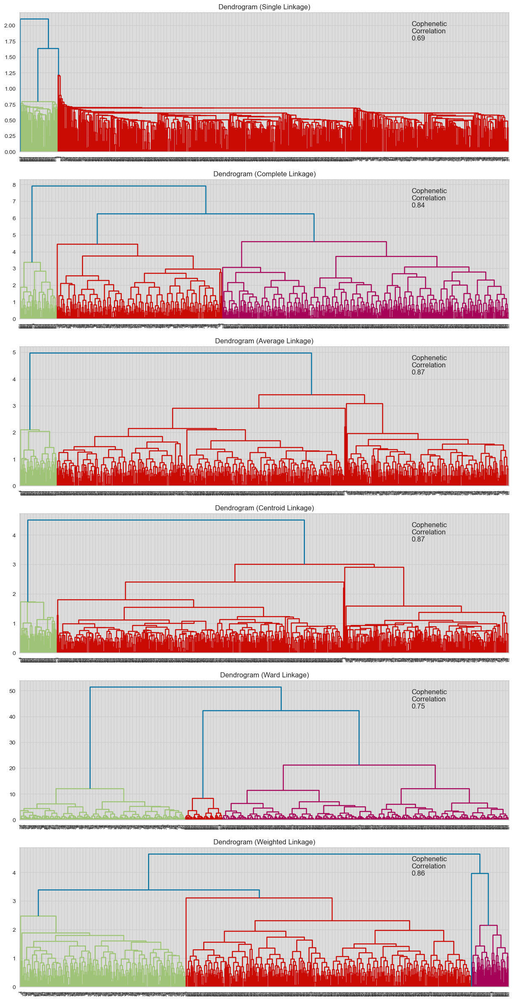

<IPython.core.display.Javascript object>

In [66]:
%%time
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(customers_scaled, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(customers_scaled))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )


**Observations**

- The cophenetic correlation is highest for average and centroid linkage methods.
- We'll inspect the average linkage method with euclidian distance
- 4 or 5 looks like the optimum number of clusters from the dendrogram for average linkage.

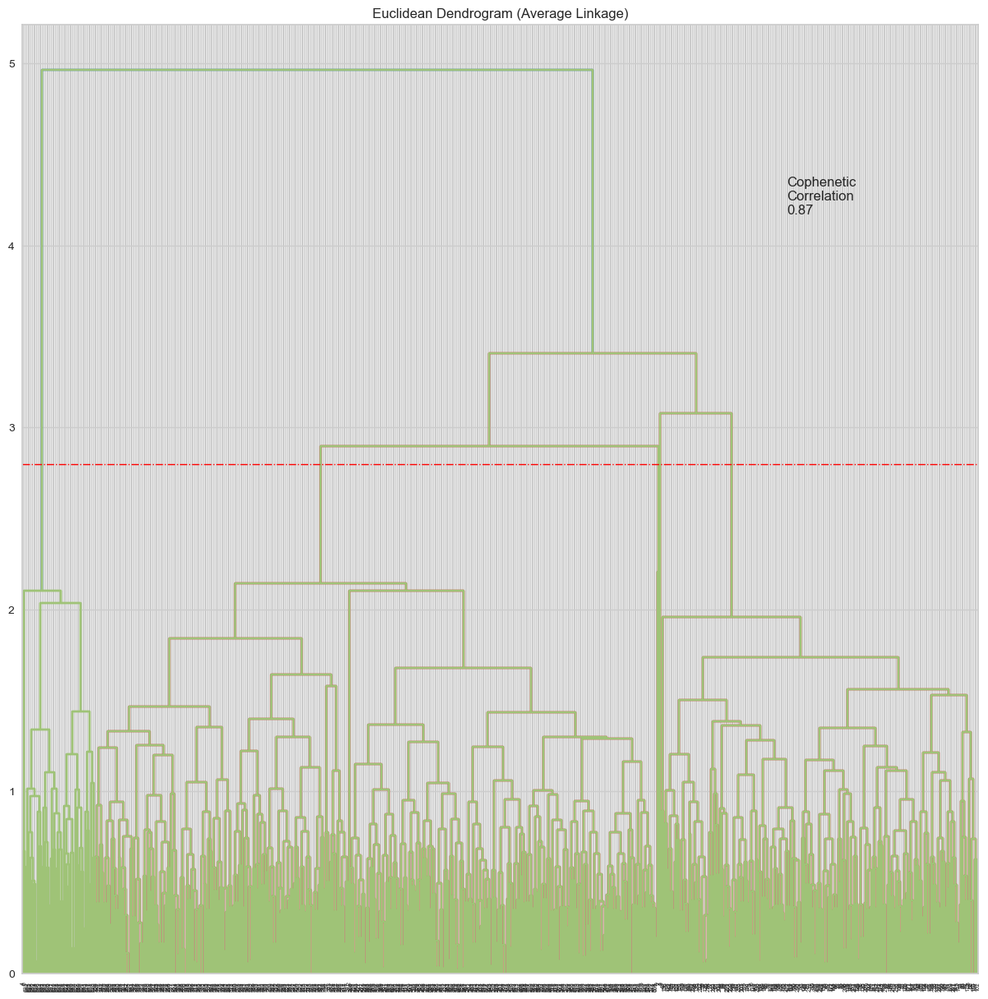

<IPython.core.display.Javascript object>

In [67]:
# just the one for this graph
linkage_methods = ["average"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 15))

# We'll reuse the code for this single linkage method, and plot the dendrogram annotating the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(customers_scaled, metric="euclidean", method=method)

    dendrogram(Z, ax=axs)
    axs.set_title(f"Euclidean Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(customers_scaled))
    axs.annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

# We'll add our cut-off line here based on inspection
dendrogram(Z, color_threshold=7.3)
plt.axhline(y=2.8, c="red", lw=1, linestyle="dashdot")

__We can use plotly here, and zoom in to examine the area where we have two closely linked clusters__

In [68]:
# distance_func = partial(pdist, metric='euclidean')

fig = ff.create_dendrogram(
    customers_scaled,
    # distfun = distance_func,
    # color_threshold=1.5,
    linkagefun=lambda x: linkage(x, metric="euclidean", method="average"),
)
fig.update_layout(width=1100, height=700)
fig.show()
fig.write_html("clustering_plotly.html")

<IPython.core.display.Javascript object>

__This is still messy; you can see visually that we're going to have some clusters with very low membership.__

*  __Two other metrics that performed well with average linkage methods were Chebyshev and CityBlock metrics.__
*  __Let's visualize those two, and see if we can get a more even distribution of members in our clusters.__

__Let's try Chebyshev first__

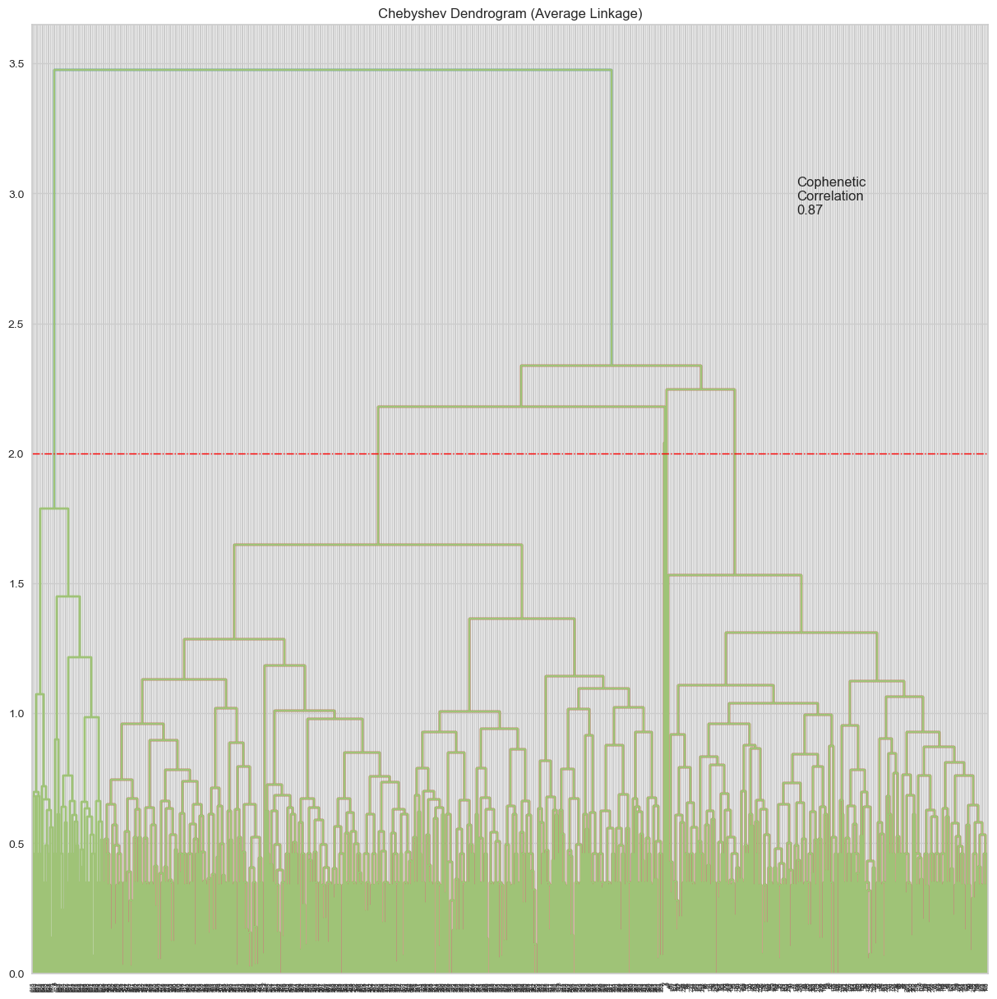

<IPython.core.display.Javascript object>

In [69]:
# just the one for this graph
linkage_methods = ["average"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 15))

# We'll reuse the code for this single linkage method, and plot the dendrogram annotating the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(customers_scaled, metric="chebyshev", method=method)

    dendrogram(Z, ax=axs)
    axs.set_title(f"Chebyshev Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(customers_scaled))
    axs.annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

# We'll add our cut-off line here based on inspection
dendrogram(Z, color_threshold=7.3)
plt.axhline(y=2.0, c="red", lw=1, linestyle="dashdot")

__Very similar results to the Euclidean plot.  Let's try the CityBlock distance metric next__

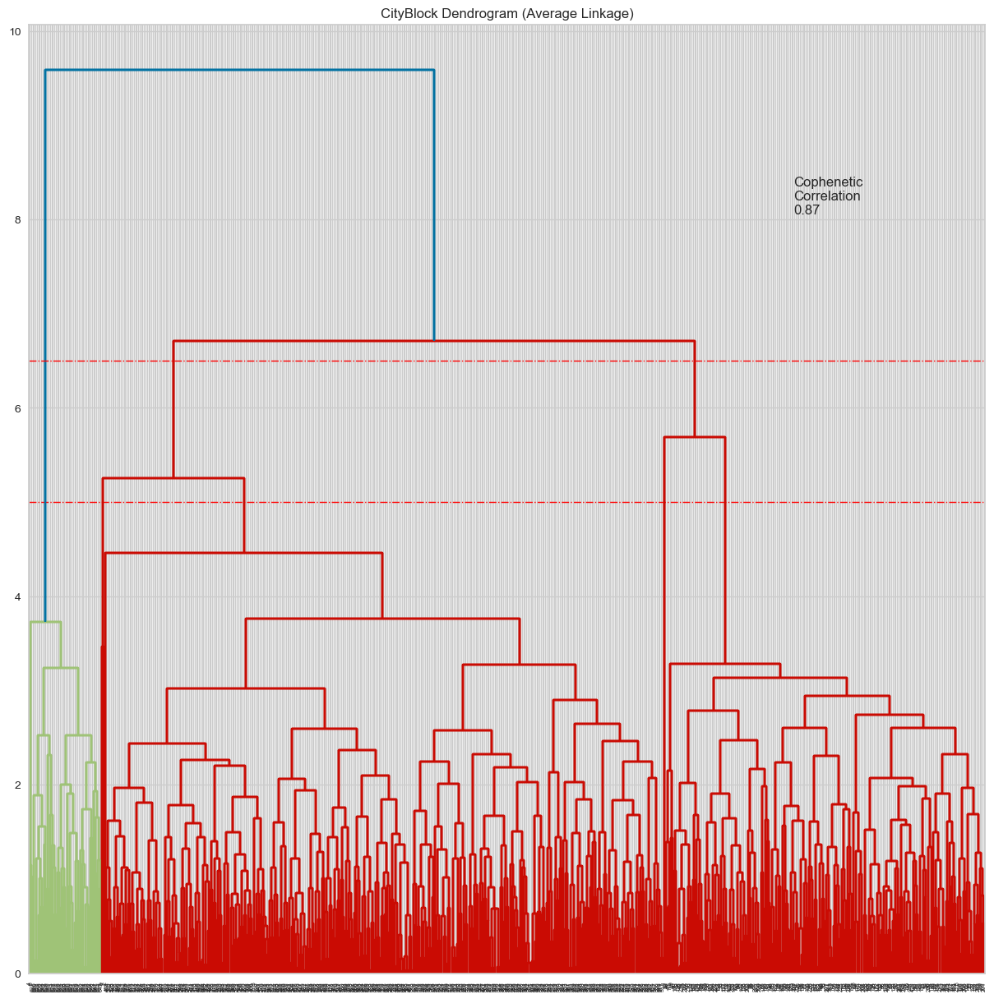

<IPython.core.display.Javascript object>

In [70]:
# just the one for this graph
linkage_methods = ["average"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 15))

# We'll reuse the code for this single linkage method, and plot the dendrogram annotating the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(customers_scaled, metric="cityblock", method=method)

    dendrogram(Z, ax=axs)
    axs.set_title(f"CityBlock Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(customers_scaled))
    axs.annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

# We'll add our cut-off line here based on inspection
dendrogram(Z, color_threshold=7.3)
plt.axhline(y=5.0, c="red", lw=1, linestyle="dashdot")

dendrogram(Z, color_threshold=7.3)
plt.axhline(y=6.5, c="red", lw=1, linestyle="dashdot")

* __This yields an excellent cophenetic correlation, and potentially a cleaner distribution at either 5 clusters or 3 clusters.__
* __Let's move forward with CityBlock, and take a look at the distributions for both 5 and 3 clusters.__

## Hierarchical Clustering

__Five Clusters__

In [71]:
%%time
%%memit
HCmodel = AgglomerativeClustering(n_clusters=5, affinity="cityblock", linkage="average")
HCmodel.fit(customers_scaled)

peak memory: 436.41 MiB, increment: 3.35 MiB
Wall time: 1.78 s


<IPython.core.display.Javascript object>

In [72]:
customers_scaled["HC_Clusters"] = HCmodel.labels_
# customers["HC_Clusters"] = HCmodel.labels_

<IPython.core.display.Javascript object>

In [73]:
customers_scaled["HC_Clusters"].value_counts()

0    386
2    221
1     50
4      2
3      1
Name: HC_Clusters, dtype: int64

<IPython.core.display.Javascript object>

__Similar to our initial euclidean model, with two very sparsely populated clusters we're unable to differentiate__

__Three Clusters__

In [74]:
%%time
%%memit
HCmodel = AgglomerativeClustering(n_clusters=3, affinity="cityblock", linkage="average")
HCmodel.fit(customers_scaled)

peak memory: 436.41 MiB, increment: 3.32 MiB
Wall time: 1.78 s


<IPython.core.display.Javascript object>

In [75]:
customers_scaled["HC_Clusters"] = HCmodel.labels_
customers["HC_Clusters"] = HCmodel.labels_

<IPython.core.display.Javascript object>

In [76]:
customers_scaled["HC_Clusters"].value_counts()

2    386
0    224
1     50
Name: HC_Clusters, dtype: int64

<IPython.core.display.Javascript object>

__This looks more evenly distributed. In the end, the number of clusters is going to boil down to the granularity with which we intend to take action.__

In [77]:
cluster_profile = customers.groupby("HC_Clusters").mean()

<IPython.core.display.Javascript object>

In [78]:
# adding a count by cluster
cluster_profile["count_in_each_segment"] = (
    customers.groupby("HC_Clusters")["Avg_Credit_Limit"].count().values
)

<IPython.core.display.Javascript object>

In [79]:
# let's display cluster profiles - MAX
cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Customer_Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,Both,Avg_Credit_Limit_log,K_means_segments,count_in_each_segment
HC_Clusters,,,,,,,,,,
0,55306.424107,12589.285714,2.401786,0.928571,3.549107,6.852679,0.642857,9.330021,0.008929,224
1,56708.760000,141040.000000,8.740000,0.600000,10.900000,1.080000,0.600000,11.825513,3.000000,50
2,54842.683938,33541.450777,5.520725,3.492228,0.984456,2.010363,0.626943,10.145688,1.564767,386


<IPython.core.display.Javascript object>

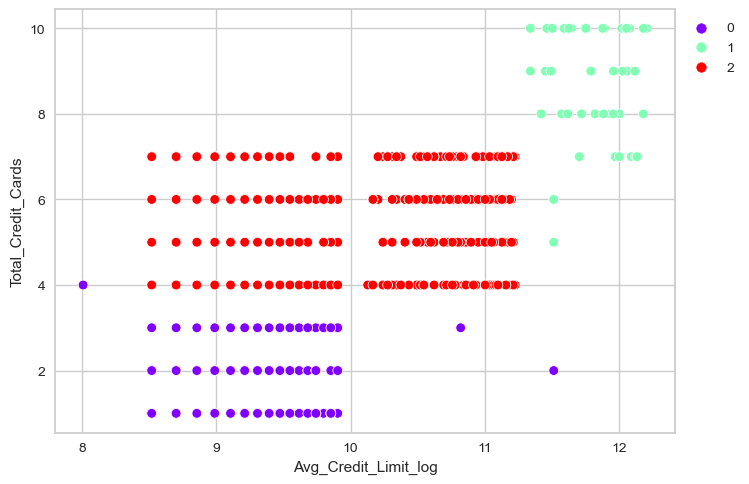

<IPython.core.display.Javascript object>

In [89]:
# One more way to visualize our clusters
sns.scatterplot(
    data=customers,
    x="Avg_Credit_Limit_log",
    y="Total_Credit_Cards",
    hue=customers["HC_Clusters"],
    palette="rainbow",
)
plt.legend(bbox_to_anchor=(1, 1))

__Based on this graph, we could make a distinction between lower-credit limit and higher-credit limit customers with the same number of credit cards. Whether we break those out depends entirely on the business goals and actions we can execute.__

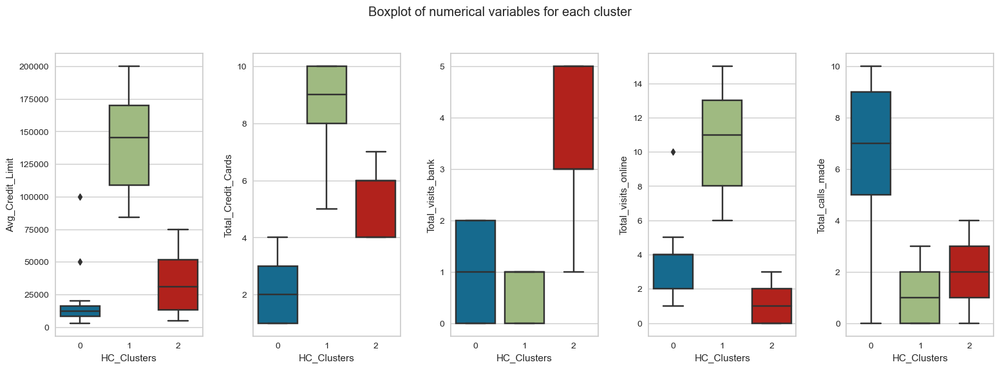

<IPython.core.display.Javascript object>

In [81]:
# Now we'll look at a plot of the relevant features, excluding Customer Key
fig, axes = plt.subplots(1, 5, figsize=(16, 6))
fig.suptitle("Boxplot of numerical variables for each cluster")
counter = 1
for ii in range(5):
    sns.boxplot(ax=axes[ii], y=customers[num_cols[counter]], x=customers["HC_Clusters"])
    counter = counter + 1

fig.tight_layout(pad=2.0)

### Insights

- **Cluster 0**:
  - This is the segment that makes the highest number of support calls, by far.
  - They also don't tend to either visit the bank physically, or the online portal.
  - This segment of customers also has the lowest available credit, and correspondingly fewer credit cards.
- **Cluster 1**:
  - These are our high-credit limit customers with the greatest number of credit cards.
  - These are strong online portal users; they favor the online banking experience over visiting the bank physically.
  - This segment also rarely makes support calls - they are likely finding what they need on the portal.
- **Cluster 2**:
  - This segment strongly prefers visiting the bank lobby over using the online portal.
  - These customers tend not to log support calls; they are likely getting the support they need in person.
  - These customer have more credit cards, but tend to have a smaller average credit limit.

__Group Membership__

In [82]:
# We'll store a list of customer keys in each segment to use for our comparison later on
hierarchical_cluster_0 = (
    customers.loc[customers["HC_Clusters"] == 0, "Customer_Key"].unique().tolist()
)

hierarchical_cluster_1 = (
    customers.loc[customers["HC_Clusters"] == 1, "Customer_Key"].unique().tolist()
)

hierarchical_cluster_2 = (
    customers.loc[customers["HC_Clusters"] == 2, "Customer_Key"].unique().tolist()
)


<IPython.core.display.Javascript object>

## K-means vs Hierarchical Clustering

__Methodology - how do we evaluate these two approaches to clustering?__

No single metric is going to offer the optimal solution; the best solution for our needs will balance performance, explainability, the quality metrics appropriate for our methods, and the intended business requirement.

In this case, the business is looking to increase market penetration - that basically means more credit cards to both existing customers, and new customers. We see in our data that generally higher average credit limits correlate with more credit cards; each card carries it's own limit.

A secondary goal is to try to improve the support model, and get better quality of support to customers across the installed base.

So - to take actions to support these goals, we don't want to over-segment our customers.  We want a few, clear distinctions between segments to help guide a handful of actions that will have an easily measurable impact on our business objectives.

__Performance__

Performance is difficult to evaluate, because we have such a tiny number of features and a very small dataset for this exercise.  I used both timing and memory utilization as metrics on the operations to fit the model.

In terms of wall time, the k-means model tool 1.13secs and the hierarchical model took 1.84secs - slightly more compute intensive, and with a larger data set this might have been a more marked contrast. Memory requirements looked to be about the same for either method.

I did not consider visualization times at all.  Apples and oranges, and not relevant for production.

__Results__

Using the k-means method, we were able to see four distinct segments. Hierarchical gave us the best results with three groups; attempting to cluster into more segments just produced very sparse membership. __Based on our business requirements, I would likely go with segmentation into four groups, using k-means clustering.__

One interesting question might be to examine the nature of the clusters, and try to determine - for clusters with similar characteristics beween the two methods - how much overlap exists in the membership of these similar clusters.  We don't have any customer demographic data, but the question is: for each clustering method, do they produce clusters with roughly similar membership?

I added some code to save the membership iof each cluster for both k-means and hierarchical segmentation. I'll use a function to find the intersection between clusters with similar characteristics, and we'll calculate the overlap.


#### Useful Functions

In [83]:
# Let's define a function that will help us determine how similar two clusters are
def calculate_overlap_percentage(list1, list2):
    # Calculate the intersection of two lists
    intersection = list(set(list1) & set(list2))

    # Calculate the percentage of overlap
    overlap_percentage = (len(intersection) / len(list1)) * 100

    return overlap_percentage


<IPython.core.display.Javascript object>

#### Support Dependent Customers

__Let's start with the two Cluster 0 segments with each method:__

*K-means*
- **Cluster 0**:
  - Distinctly the predominate callers into the support line
  - At the same time, they are relatively infrequently users of the online portal
  - Least number of credit cards of all the segments, with a correspondingly low average credit limit 

*Hierarchical*
- **Cluster 0**:
  - This is the segment that makes the highest number of support calls, by far.
  - They also don't tend to either visit the bank physically, or the online portal.
  - This segment of customers also has the lowest available credit, and correspondingly fewer credit cards.

In [84]:
# Order matters! This is the percentage of the intersection that overlaps with the first list below
percentage_overlap = calculate_overlap_percentage(
    hierarchical_cluster_0, k_means_cluster_0
)
print(
    "The length of the hierarchical cluster is", len(hierarchical_cluster_0), "elements"
)
print("The length of the k-means cluster is", len(k_means_cluster_0), "elements")

print(f"Overlap Percentage between methods for Cluster 0: {percentage_overlap:.2f}%")

The length of the hierarchical cluster is 224 elements
The length of the k-means cluster is 223 elements
Overlap Percentage between methods for Cluster 0: 99.55%


<IPython.core.display.Javascript object>

#### High Credit Limit Customers

__Next, let's look at the high-credit limit customers, cluster 3 for k-means and cluster 1 for hierarchical__

*K-means*
- **Cluster 3**:
  - This segment is distinguished with the greatest number of credit cards, and the highest average credit limits
  - These customers prefer to do their banking on the online portal, visiting the bank very infrequently
  - They are also the least frequent callers into online support, suggesting a better educated or more sophisticated group

*Hierarchical*
- **Cluster 1**:
  - These are our high-credit limit customers with the greatest number of credit cards.
  - These are strong online portal users; they favor the online banking experience over visiting the bank physically.
  - This segment also rarely makes support calls - they are likely finding what they need on the portal.

In [85]:
# Order matters! This is the percentage of the intersection that overlaps with the first list below
percentage_overlap = calculate_overlap_percentage(
    hierarchical_cluster_1, k_means_cluster_3
)
print(
    "The length of the hierarchical cluster is", len(hierarchical_cluster_1), "elements"
)
print("The length of the k-means cluster is", len(k_means_cluster_3), "elements")

print(f"Overlap Percentage between methods for Cluster 0: {percentage_overlap:.2f}%")

The length of the hierarchical cluster is 50 elements
The length of the k-means cluster is 50 elements
Overlap Percentage between methods for Cluster 0: 100.00%


<IPython.core.display.Javascript object>

#### Brick and Mortar, Hold my Hand customers

__Next, let's look at customers who perfer face to face banking, cluster 1 for k-means and cluster 2 for hierarchical__

*K-means*
- **Cluster 1**:
  - This is the segment that prefers mostly to visit the bank lobby physically
  - Infrequently users of online banking, and also infrequently calls into the support line
  - These users have more credit cards in their wallet, but a relatively low average credit limit

*Hierarchical*
- **Cluster 2**:
  - This segment strongly prefers visiting the bank lobby over using the online portal.
  - These customers tend not to log support calls; they are likely getting the support they need in person.
  - These customer have more credit cards, but tend to have a smaller average credit limit.

In [86]:
# Order matters! This is the percentage of the intersection that overlaps with the first list below
percentage_overlap = calculate_overlap_percentage(
    hierarchical_cluster_2, k_means_cluster_1
)
print(
    "The length of the hierarchical cluster is", len(hierarchical_cluster_2), "elements"
)
print("The length of the k-means cluster is", len(k_means_cluster_1), "elements")

print(f"Overlap Percentage between methods for Cluster 0: {percentage_overlap:.2f}%")

The length of the hierarchical cluster is 384 elements
The length of the k-means cluster is 168 elements
Overlap Percentage between methods for Cluster 0: 43.75%


<IPython.core.display.Javascript object>

__K-means Cluster 2 has similar characteristics, but the customers in this segment have generally higher credit limits.__

*K-means*
- **Cluster 2**:
  - This segment also strongly prefers to visit the bank lobby
  - They have a broader range of credit cards in their wallet, and a higher average credit limit than segment 1
  - Also relatively infrequent users of the online portal, or the support line

In [87]:
# Order matters! This is the percentage of the intersection that overlaps with the first list below
percentage_overlap = calculate_overlap_percentage(
    hierarchical_cluster_2, k_means_cluster_2
)
print(
    "The length of the hierarchical cluster is", len(hierarchical_cluster_2), "elements"
)
print("The length of the k-means cluster is", len(k_means_cluster_2), "elements")

print(f"Overlap Percentage between methods for Cluster 0: {percentage_overlap:.2f}%")

The length of the hierarchical cluster is 384 elements
The length of the k-means cluster is 218 elements
Overlap Percentage between methods for Cluster 0: 56.51%


<IPython.core.display.Javascript object>

__Essentially the two k-means clusters - cluster 1 and cluster 2 - encompass the segment that hierarchical groups into a single cluster, which is hierarchical cluster 2.  Depending on whether you want to focus on the support issue or growing market penetration, you could choose either method. To best address both the primary and secondary objectives, I would recommend four segments with the K-means clustering approach.__

## Actionable Insights and Recommendations

* __Move forward with the K-means based model, and four major customer segments to address both primary and secondary objectives__
* __We have distinct segments of customers that distinctly prefer either face to face, or online banking - but few that make equal use of both interactions.  We need to ensure that the opportunities, promotions, and overall experience is optimized for both lobby and mobile banking, and that we don't shortchange one for the other.__
* __Some of our highest-credit limit customers bank eclusively through the online portal.  We need to ensure we don't lose contact with them, perhaps by offering consulting sessions by phone or video chat__
* __Fully one-fith of our customers never use our online portal. Are there services that we only offer through the portal? If so, we either need to encourage greater use of the portal, or ensure those services are accessible other ways.__
* __About 15% of our customers never visit the bank lobby, and a similar number never interact with support.  We need to drive higher engagement with customers, both for retention and as a differentiator for our services.__